In [52]:
from collections import Counter # to keep track of top predictions
from io import BytesIO # "file system" for manipulating binary data in memory
from PIL import Image, ImageDraw, ImageFont
from torchvision import transforms as T
import torchvision.models as models
from IPython.display import display, Javascript
from IPython.utils import io
import ipywidgets as widgets
from nbconvert import PDFExporter
import matplotlib.pyplot as plt
%matplotlib inline
import nbformat
import csv
import cv2
import requests
import os
import random
import numpy as np
import torch
import albumentations as A
from albumentations import (
    ISONoise,
    ColorJitter,
    MultiplicativeNoise,
    CoarseDropout,
    GaussianBlur,
    RandomBrightnessContrast,
    CLAHE,
    RGBShift,
    RandomGridShuffle,
    HueSaturationValue,
    MotionBlur,
    GaussNoise,
    GlassBlur,
    PixelDropout,



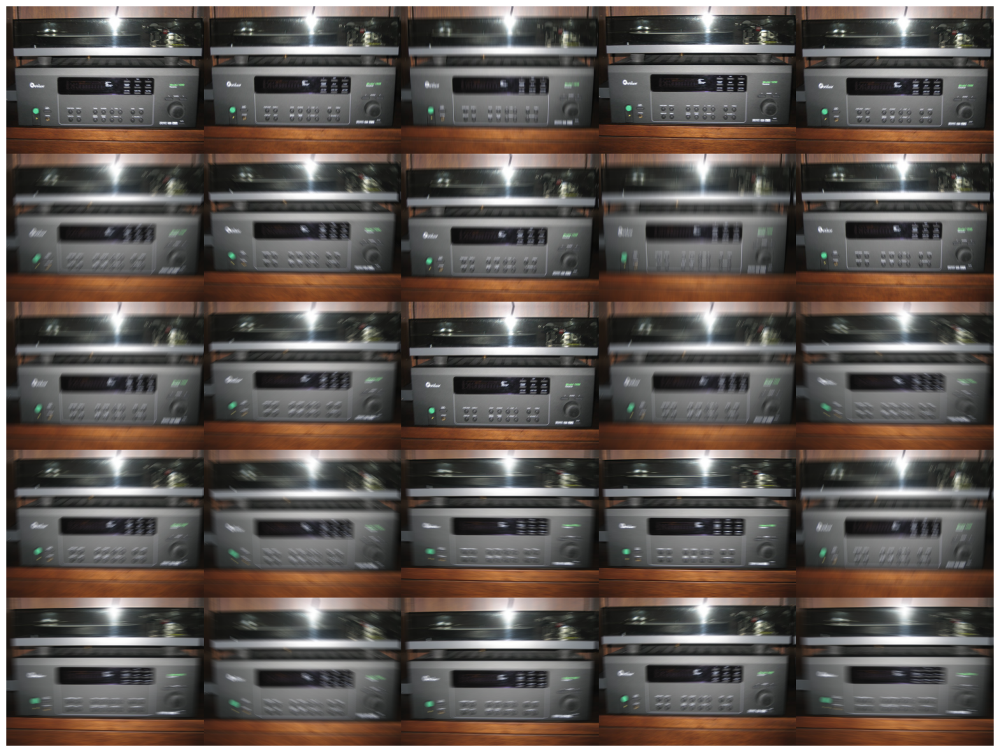

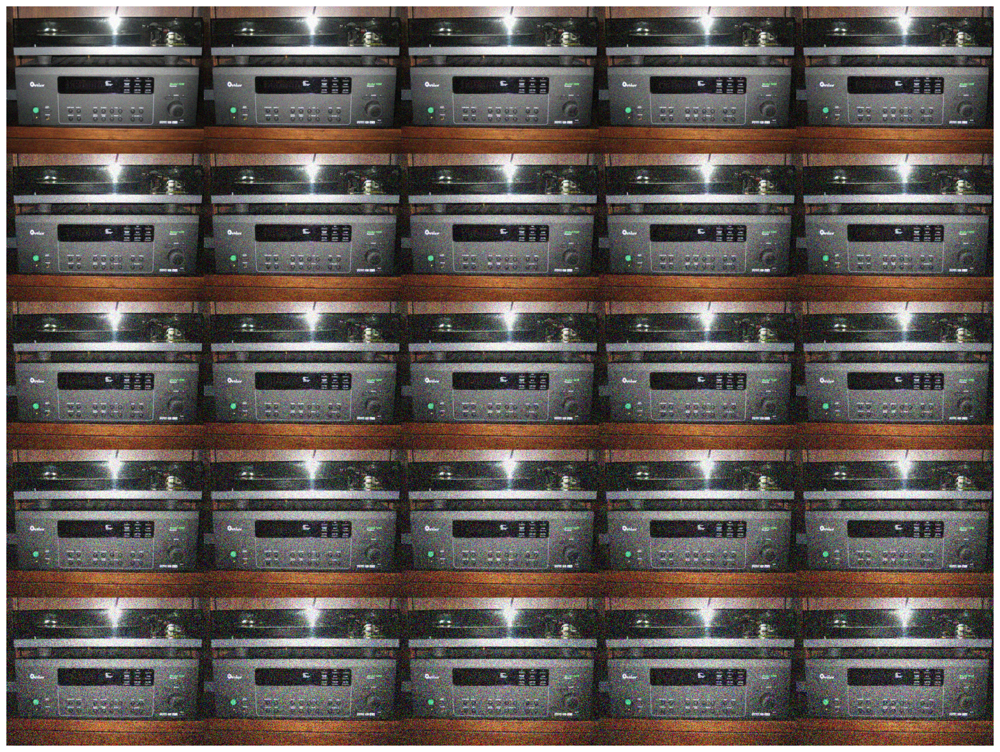

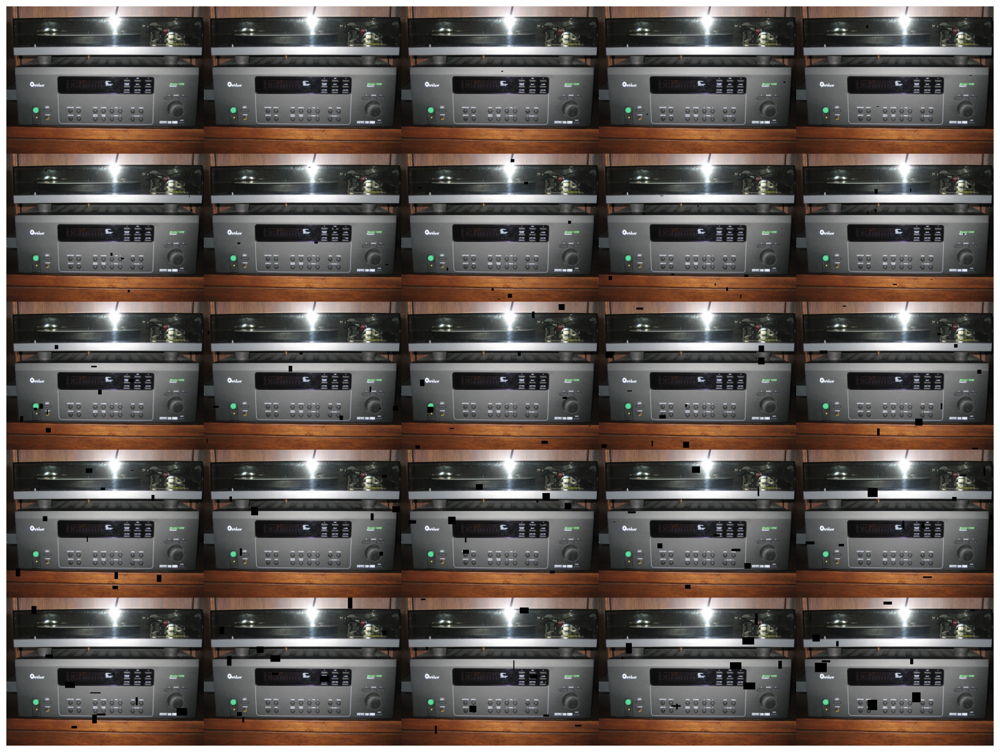

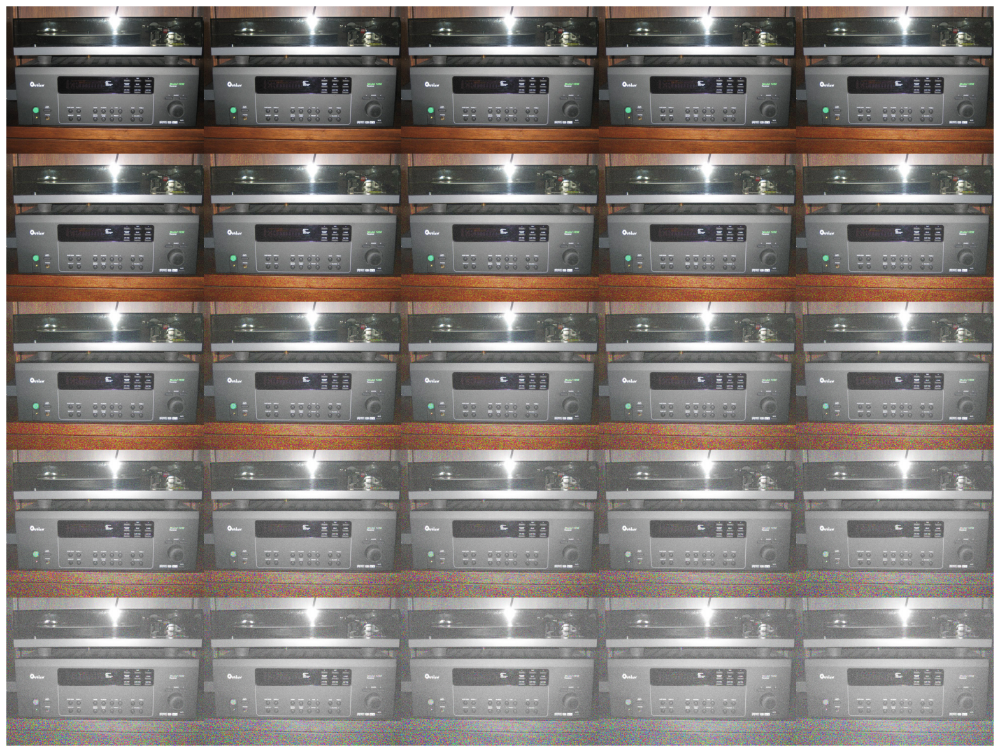

In [54]:
def pick_random_image_from_imagenet(imagenet_base_directory):
    # select a random folder from imagenet
    dataset_path = os.path.join(imagenet_base_directory, 'train')
    category_dirs = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
    
    if not category_dirs:
        raise ValueError(f"No category directories found in {dataset_path}. Please check the path.")
    
    chosen_category = random.choice(category_dirs)
    category_path = os.path.join(dataset_path, chosen_category)
    
    # Choose a random image
    all_images = [f for f in os.listdir(category_path) if f.endswith('.JPEG')]
    if not all_images:
        raise ValueError(f"No images found in {category_path}.")
    
    chosen_image = random.choice(all_images)
    image_path = os.path.join(category_path, chosen_image)
    
    return image_path

# Set up augmentation variables
def augment_image_gaussian_blur(image, blur_limit):
    transform = GaussianBlur(blur_limit=blur_limit, always_apply=True)
    augmented = transform(image=image)['image']
    return augmented

def augment_image_glassblur(image, sigma, max_delta, iterations):
    transform = GlassBlur(sigma=sigma, max_delta=max_delta, iterations=iterations, always_apply=True)
    augmented = transform(image=image)['image']
    return augmented

def augment_image_motion_blur(image, blur_limit):
    transform = MotionBlur(blur_limit=blur_limit, always_apply=True)
    augmented = transform(image=image)['image']
    return augmented

def augment_image_brightness_contrast(image, brightness_limit, contrast_limit):
    transform = RandomBrightnessContrast(brightness_limit=brightness_limit, contrast_limit=contrast_limit, always_apply=True)
    augmented = transform(image=image)['image']
    return augmented

def augment_image_clahe(image, clip_limit, tile_grid_size):
    transform = CLAHE(clip_limit=clip_limit, tile_grid_size=tile_grid_size, always_apply=True)
    augmented = transform(image=image)['image']
    return augmented

def augment_image_colorjitter(image, brightness, contrast, saturation, hue):
    transform = ColorJitter(brightness=brightness, contrast=contrast, saturation=saturation, hue=hue, always_apply=True)
    augmented = transform(image=image)['image']
    return augmented

def augment_image_coarse(image, max_holes, max_height, max_width, fill_value):
    transform = CoarseDropout(max_holes=max_holes, max_height=max_height, max_width=max_width, min_height=1, min_width=1, fill_value=fill_value, always_apply=True)
    augmented = transform(image=image)['image']
    return augmented

def augment_image_gaussian(image, blur_limit, sigma_limit, distortion_level):
    blur = blur_limit * distortion_level
    sigma = sigma_limit * distortion_level
    transform = GaussNoise(var_limit=(blur, blur), mean=0, always_apply=True)
    augmented = transform(image=image)['image']
    return augmented

blur_limit = 100  # Maximum limit for the blur value
sigma_limit = 100  # Maximum limit for the sigma value
distortion_level = 1

def augment_image_grid_shuffle(image, grid):
    transform = RandomGridShuffle(grid=(grid, grid), always_apply=True)
    augmented = transform(image=image)['image']
    return augmented

def augment_image_hue_saturation_value(image, hue_shift_limit, sat_shift_limit, val_shift_limit):
    transform = HueSaturationValue(hue_shift_limit=hue_shift_limit, sat_shift_limit=sat_shift_limit, val_shift_limit=val_shift_limit, always_apply=True)
    augmented = transform(image=image)['image']
    return augmented

def augment_image_iso(image, color_shift, intensity):
    color_shift_range= (1, 40)
    intensity_range= (.1, 2)
    transform = ISONoise(color_shift=(color_shift, color_shift), intensity=(intensity, intensity), always_apply=True)
    augmented = transform(image=image)['image']
    return augmented

def augment_image_multiplicative(image, multiplier):
    transform = MultiplicativeNoise(multiplier=multiplier, per_channel=True, always_apply=True)
    augmented = transform(image=image)['image']
    return augmented

def augment_image_rgb_shift(image, r_shift_limit, g_shift_limit, b_shift_limit):
    transform = RGBShift(r_shift_limit=r_shift_limit, g_shift_limit=g_shift_limit, b_shift_limit=b_shift_limit, always_apply=True)
    augmented = transform(image=image)['image']
    return augmented
def augmentation_pipeline(imagenet_base_directory, montage_shape=(5, 5)):
    """The main pipeline to pick a random image from ImageNet, augment it, and display the montage."""
    image_path = pick_random_image_from_imagenet(imagenet_base_directory)
    image = Image.open(image_path)
    
    augmented_images = apply_all_augmentations(image)
    create_and_display_montage(augmented_images, montage_shape)

import numpy as np

#create a montage to visualize the transformations
def create_montage(images, montage_shape):
    montage_image = np.zeros((montage_shape[0] * images[0].shape[0], montage_shape[1] * images[0].shape[1], 3), dtype=np.uint8)
    for i in range(montage_shape[0]):
        for j in range(montage_shape[1]):
            montage_image[i * images[0].shape[0]:(i + 1) * images[0].shape[0],
                         j * images[0].shape[1]:(j + 1) * images[0].shape[1], :] = images[i * montage_shape[1] + j]
    return montage_image

#set up the augmentation parameters
def augment_images_and_create_montage(imagenet_base_directory, save_montages=True, save_directory='/media/jen/T7/ImageNet/ImageNet Data/Montages'):
    augmentation_functions = [
        augment_image_motion_blur,
        augment_image_gaussian,
        augment_image_coarse,
        augment_image_iso,
    ]
    
    image_path = pick_random_image_from_imagenet(imagenet_base_directory)
    image = Image.open(image_path)
    image = np.array(image)
    
    for augment in augmentation_functions:
        augmentations = []
        for i in range(25):
                augmented = None

                if augment == augment_image_gaussian_blur:
                    lower_limit = max(3, min(21, 2 * (i // 10) + 1))  # Starts at 3 and increases by 2 every 10 iterations
                    upper_limit = lower_limit + 2  # Always 2 more than the lower_limit
                    blur_limit = (lower_limit, upper_limit)
                    augmented = augment(image, blur_limit)

                elif augment == augment_image_motion_blur:
                    lower_limit = max(3, min(21, 2 * (i + 1) + 1))  # Starts at 3 and increases by 2 every iteration, up to 21
                    upper_limit = lower_limit + 2  # Always 2 more than the lower_limit
                    blur_limit = (lower_limit, upper_limit)
                    augmented = augment(image, blur_limit)

                if augment == augment_image_brightness_contrast:
                    brightness_limit = min(0.008 * (i + 1), 0.8)
                    contrast_limit = min(0.008 * (i + 1), 0.8)
                    augmented = augment(image, brightness_limit, contrast_limit)

                if augment == augment_image_clahe:
                    clip_limit = min(1.0 + 1 * (i + 1), 4.0)  # Gradually increase the clip_limit with each iteration
                    grid_value = min(1 + i, 8)  # Gradually increase the tile_grid_size with each iteration
                    tile_grid_size = (grid_value, grid_value)  # Set both the width and height of the tile grid size
                    augmented = augment(image, clip_limit, tile_grid_size)

                if augment == augment_image_colorjitter:
                    brightness = min(0.01 * (i + 1), 10.0)  # Gradually increase brightness with each iteration
                    contrast = min(0.01 * (i + 1), 10.0)  # Gradually increase contrast with each iteration
                    saturation = min(0.01 * (i + 1), 10.0)  # Gradually increase saturation with each iteration
                    hue = min(0.01 * (i + 1), 0.5)  # Gradually increase hue with each iteration
                    augmented = augment(image, brightness, contrast, saturation, hue)

                if augment == augment_image_coarse:
                    max_holes = min(i + 1, 10)  # Limit the maximum number of holes to 10
                    max_height = min(i + 1, 50)  # Limit the maximum height of the holes to 50
                    max_width = min(i + 1, 50)  # Limit the maximum width of the holes to 50
                    fill_value = 0
                    augmented = augment(image, max_holes, max_height, max_width, fill_value)

                if augment == augment_image_gaussian:
                    var = 150 * (i + 1)
                    augmented = augment(image, var,sigma_limit, distortion_level)   

                if augment == augment_image_glassblur:
                    sigma = max(1, min(.03 * (i + 1), 10))  # Gradually increase sigma with each iteration
                    max_delta = int(max(1, min(.03 * (i + 1), 20)))  # Gradually increase max_delta with each iteration
                    iterations = max(1, min(i// 10 +1, 20)) # Gradually increase 
                    augmented = augment(image, sigma, max_delta, iterations)

                if augment == augment_image_grid_shuffle:
                    grid = max(2, min(i// 20 + 1, 5))  # Gradually increase the grid size with each iteration
                    augmented = augment(image, grid)

                elif augment == augment_image_hue_saturation_value:
                    hue_shift_limit = random.uniform(-180, 180)  # Randomly select a hue shift limit for each iteration
                    sat_shift_limit = random.uniform(0, 1)  # Randomly select a saturation shift limit for each iteration
                    val_shift_limit = random.uniform(0, 1)  # Randomly select a value shift limit for each iteration
                    augmented = augment(image, hue_shift_limit, sat_shift_limit, val_shift_limit)

                elif augment == augment_image_iso:
                    color_shift = 0.01 * (i + 1) 
                    intensity = 0.01 * (i + 1) * 8
                    augmented = augment(image, color_shift, intensity)

                if augment == augment_image_multiplicative:
                    multiplier = 1 + 4 * (i / (num_augmentations - 1))  # Map the range of i to the range of multiplier
                    augmented = augment(image, (1, multiplier))

                if augment == augment_image_rgb_shift:
                    r_shift_limit = max(min(10 + 1.5 * (i + 1), 250), -250)
                    g_shift_limit = max(min(10 + 1.5 * (i + 1), 250), -250)
                    b_shift_limit = max(min(10 + 1.5 * (i + 1), 250), -250)
                    augmented = augment(image, r_shift_limit, g_shift_limit, b_shift_limit)


                if augmented is not None and augmented.ndim == 3 and augmented.shape[2] == 3 and np.any(augmented):
                    augmentations.append(augmented)

        img_size = augmentations[0].shape if augmentations else (0, 0, 0)
        montage_img = create_montage(augmentations, (5, 5))
        plt.figure(figsize=(20, 20))
        plt.imshow(montage_img)
        plt.axis('off')
        plt.show()

        if save_montages and save_directory:
            save_path = os.path.join(save_directory, os.path.basename(image_path) + "_montage.png")
            plt.imsave(save_path, montage_img)



imagenet_base_directory = 'path_to_ImageNet'
augment_images_and_create_montage(imagenet_base_directory)